# Data Processing for Time Series Analysis

This notebook processes and visualizes acoustic emission data from the given database. The main objective is to generate ground truth labels for specific events in the time series based on X-ray imaging. The resultant plots provide a clear view of the events with respect to the data.

In [1]:
# Import necessary libraries
import torch
import numpy as np
import matplotlib
from torch import nn
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
%matplotlib notebook

In [3]:
# Constants
Fs = 2000000 # For acoustic emission
Fs_x_ray = 10000 # For X-ray imaging

In [4]:
GTs = []

In [5]:
def load_data(path_data, path_names):
    """
    Loads data and names from given paths.
    """
    data = torch.load(path_data)
    names = torch.load(path_names)
    return data, names

def generate_ground_truth(time_series, start_times, end_times, values):
    """
    Generates a Ground Truth tensor based on the start and end times for specific events.
    """
    gt = torch.zeros(len(time_series), 1)
    for start, end, value in zip(start_times, end_times, values):
        gt[(time_series >= start) & (time_series <= end)] = value
    return gt

def plot_data_with_gt(time, time_series_data, ground_truth, name):
    """
    Visualizes the time series data alongside the generated Ground Truth.
    """
    plt.figure(figsize=(8,4))
    plt.plot(time, ground_truth, label='Ground Truth', linewidth=2)
    normalized_data = (time_series_data - min(time_series_data)) / (max(time_series_data) - min(time_series_data))
    plt.plot(time, normalized_data, label='Data')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.title(f'Time Series Analysis for {name}')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    

In [6]:
# Load data
xs, names = load_data('./Database/Data', './Database/names')


<IPython.core.display.Javascript object>


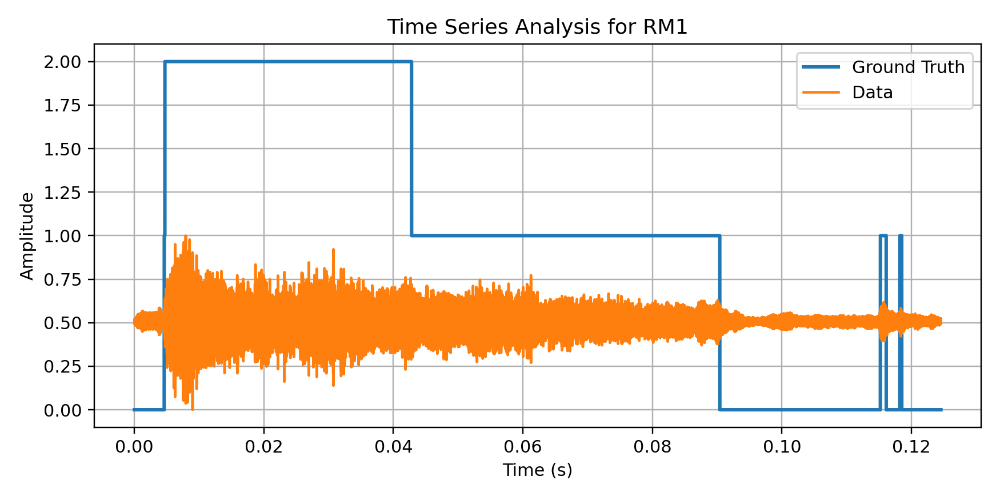

In [7]:
# Process first time series data
x = xs[0]
time = np.arange(0, len(x)) / Fs
name = names[0]
gt = generate_ground_truth(time, 
                           [0.0046, 0.0046 + 1/Fs_x_ray + 1/Fs, 0.0428 + 1/Fs, 0.1152, 0.1182],
                           [0.0046 + 1/Fs_x_ray, 0.0428, 0.0904, 0.1161, 0.1185],
                           [1, 2, 1, 1, 1])
plot_data_with_gt(time, x[:,0], gt, name)
GTs.append(gt)

<IPython.core.display.Javascript object>


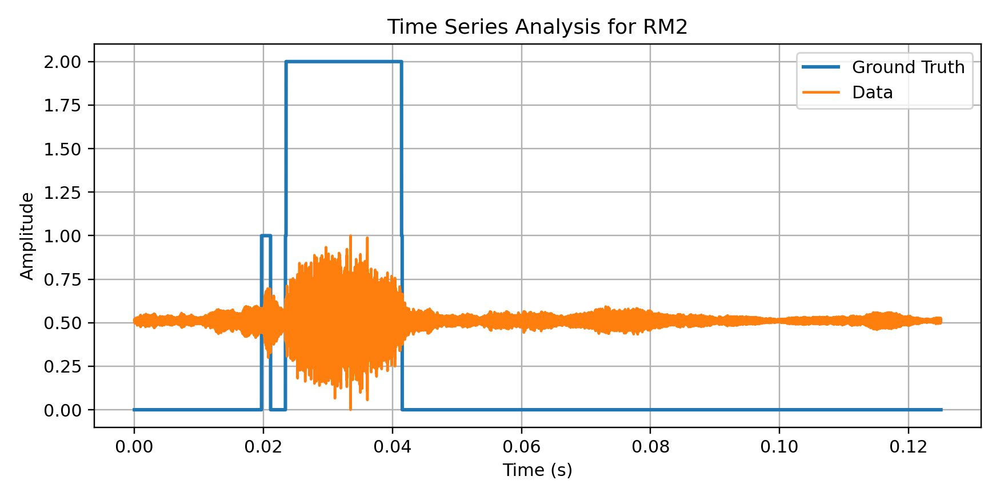

In [8]:
# Process second time series data
x = xs[1]
time = np.arange(0, len(x)) / Fs
name = names[1]
gt = generate_ground_truth(time, 
                           [0.0197, 0.0234, 0.0234 + 1/Fs_x_ray + 1/Fs, 0.0414 + 1/Fs],
                           [0.0211, 0.0234 + 1/Fs_x_ray, 0.0414, 0.0415],
                           [1, 1, 2, 1])
plot_data_with_gt(time, x, gt, name)
GTs.append(gt)

<IPython.core.display.Javascript object>


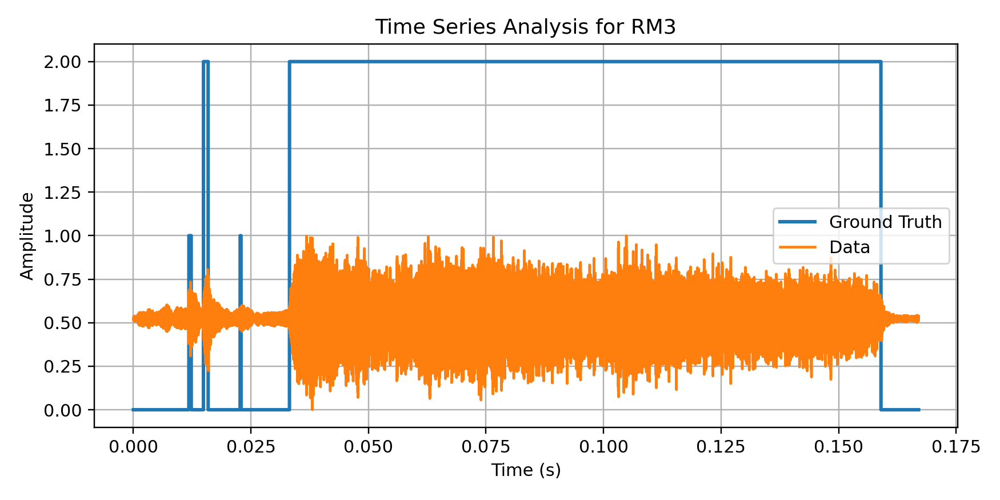

In [9]:
# Process third time series data
x = xs[2]
time = np.arange(0, len(x)) / Fs
name = names[2]
gt = generate_ground_truth(time, 
                           [0.0118, 0.0149, 0.0227, 0.0332],
                           [0.0123, 0.0159, 0.0229, 0.159],
                           [1, 2, 1, 2])
plot_data_with_gt(time, x, gt, name)
GTs.append(gt)

<IPython.core.display.Javascript object>


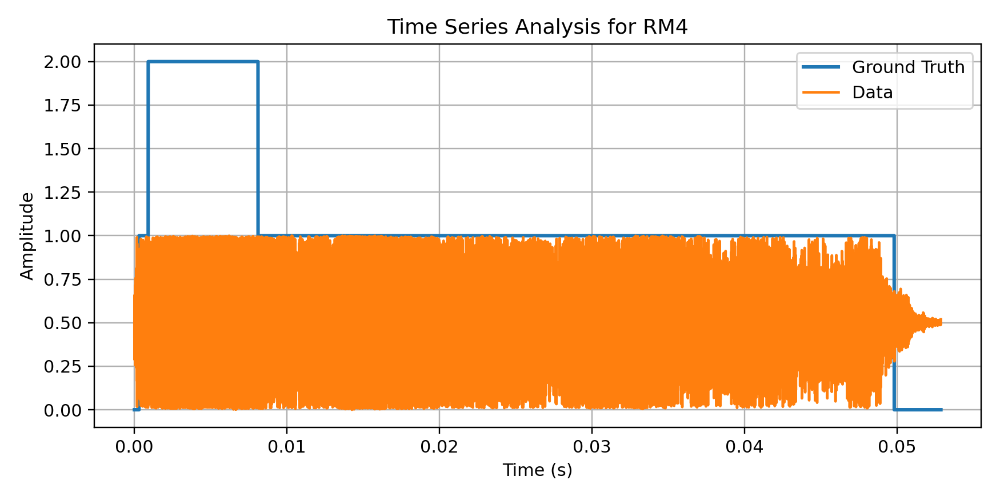

In [10]:
# Process fourth time series data
x = xs[3]
time = np.arange(0, len(x)) / Fs
name = names[3]
gt = generate_ground_truth(time, 
                           [0.0003, 0.0009 + 1/Fs, 0.0081 + 1/Fs],
                           [0.0009, 0.0081, 0.0498],
                           [1, 2, 1])
plot_data_with_gt(time, x, gt, name)
GTs.append(gt)

<IPython.core.display.Javascript object>


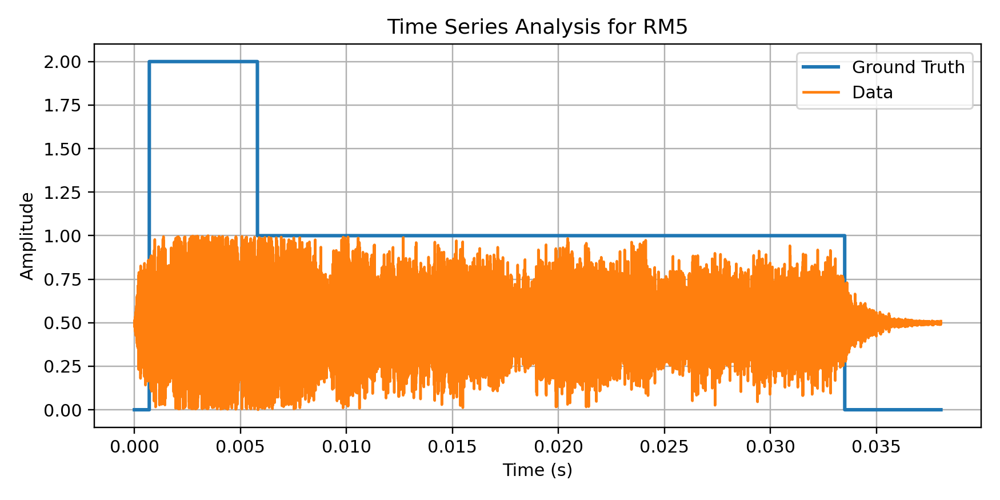

In [11]:
# Process fifth time series data
x = xs[4]
time = np.arange(0, len(x)) / Fs
name = names[4]
gt = generate_ground_truth(time, 
                           [0.0007, 0.0059 + 1/Fs  - 1/Fs_x_ray],
                           [0.0059 - 1/Fs_x_ray, 0.0335],
                           [2, 1])
plot_data_with_gt(time, x, gt, name)
GTs.append(gt)

<IPython.core.display.Javascript object>


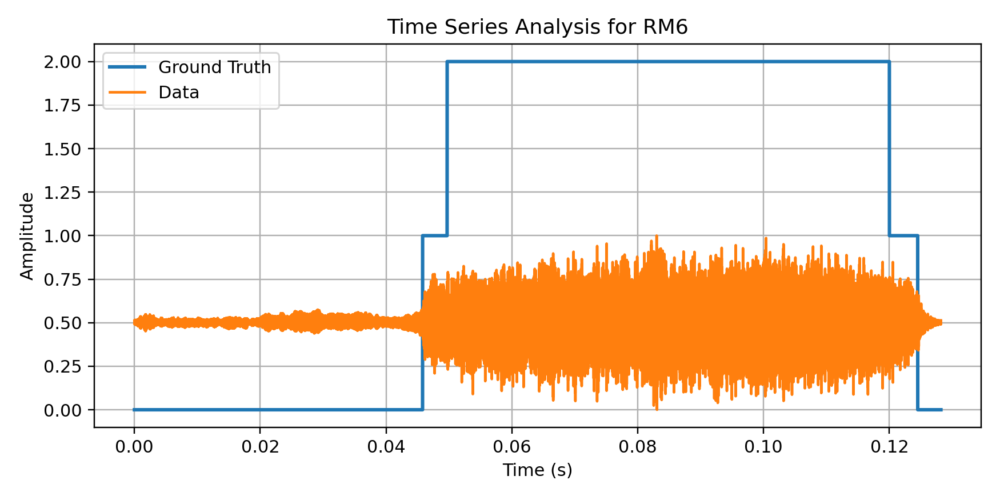

In [12]:
# Process sixth time series data
x = xs[5]
time = np.arange(0, len(x)) / Fs
name = names[5]
gt = generate_ground_truth(time, 
                           [0.0458, 0.0497 + 1/Fs, 0.120 + 1/Fs],
                           [0.0497, 0.1200, 0.1245],
                           [1, 2, 1])
plot_data_with_gt(time, x, gt, name)
GTs.append(gt)

<IPython.core.display.Javascript object>


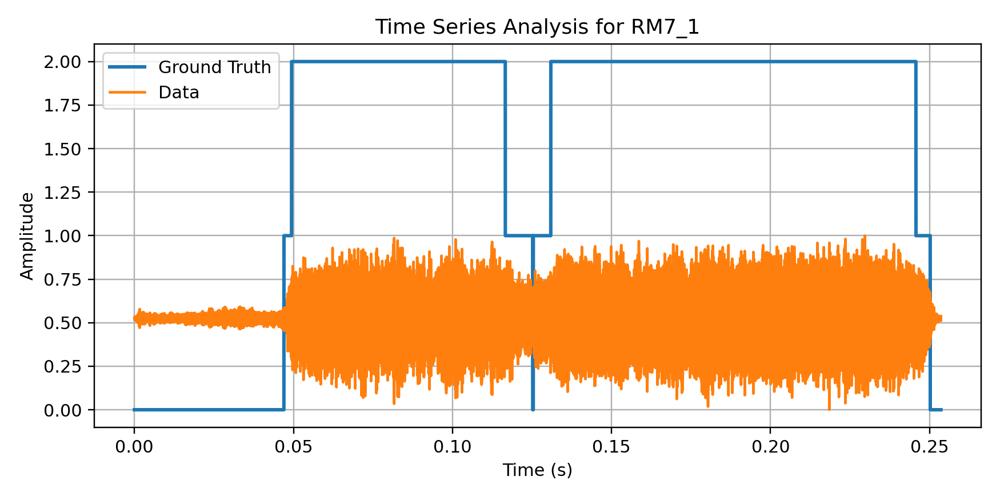

In [13]:
# Process seventh time series data
x = xs[6]
time = np.arange(0, len(x)) / Fs
name = names[6]
gt = generate_ground_truth(time, 
                           [0.0470, 0.0494 + 1/Fs, 0.1166 + 1/Fs, 0.1254, 0.1309 + 1/Fs, 0.2457 + 1/Fs],
                           [0.0494, 0.1166, 0.1252, 0.1309, 0.2457, 0.2502],
                           [1, 2, 1, 1, 2, 1])
plot_data_with_gt(time, x, gt, name)
GTs.append(gt)

<IPython.core.display.Javascript object>


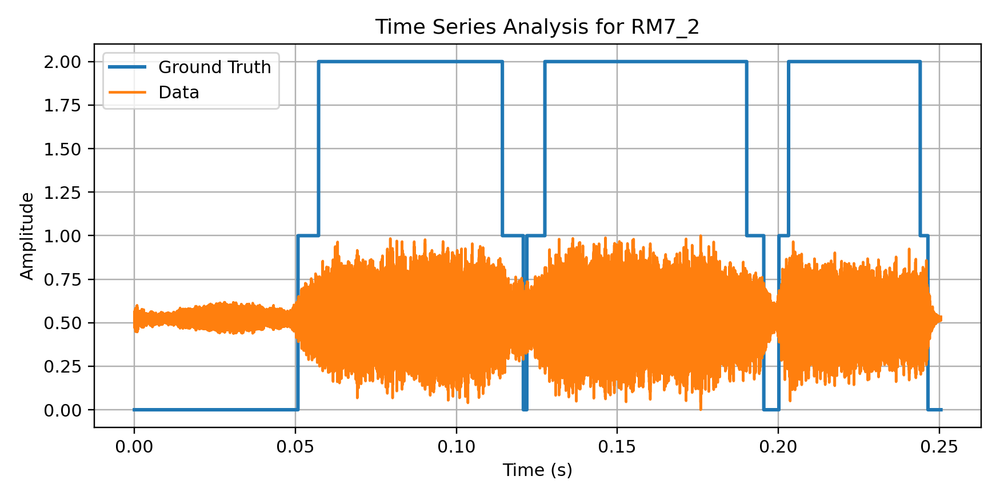

In [14]:
# Process eighth time series data
x = xs[7]
time = np.arange(0, len(x)) / Fs
name = names[7]
gt = generate_ground_truth(time, 
                           [0.0508, 0.0572 + 1/Fs, 0.1143 + 1/Fs, 0.1219, 0.1275 + 1/Fs, 0.1902 + 1/Fs, 0.2002, 0.2032 + 1/Fs, 0.2441 + 1/Fs],
                           [0.0572, 0.1143, 0.1208, 0.1275, 0.1902, 0.1955, 0.2032, 0.2441, 0.2465],
                           [1, 2, 1, 1, 2, 1, 1, 2, 1])

plot_data_with_gt(time, x, gt, name)
GTs.append(gt)

<IPython.core.display.Javascript object>


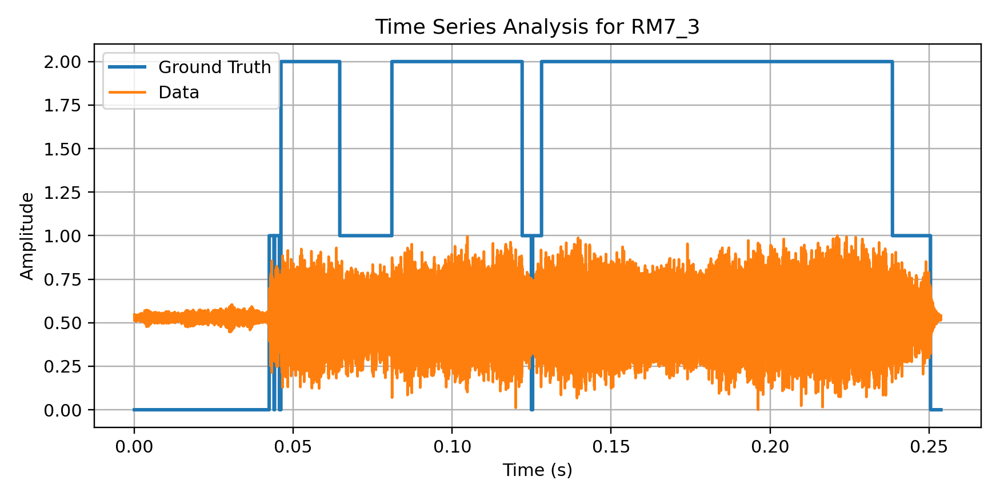

In [15]:
# Process ninth time series data
x = xs[8]
time = np.arange(0, len(x)) / Fs
name = names[8]
gt = generate_ground_truth(time, 
                           [0.0424, 0.0441, 0.0461, 0.0646 + 1/Fs, 0.0810 + 1/Fs, 0.1220 + 1/Fs, 0.1253, 0.1281 + 1/Fs, 0.2385 + 1/Fs],
                           [0.0439, 0.0456, 0.0646, 0.0810, 0.1220, 0.1249, 0.1281, 0.2385, 0.2505],
                           [1, 1, 2, 1, 2, 1, 1, 2, 1])
plot_data_with_gt(time, x, gt, name)
GTs.append(gt)

### Time Series Analysis and Visualization

In this section, we focus on the analysis and visualization of time series data recorded in our experiments. The primary goal is to contrast the signal data with the corresponding ground truth to ensure the validity of our observations.

**Key Components of the Analysis:**
1. **Signal vs. Time**: The raw signal from the experiment is plotted against time. This gives a clear representation of the signal's progression and helps us identify significant events.
2. **Spectrogram**: A spectrogram is used to visualize how the power spectrum of the signal varies with time. It's a powerful tool to identify frequencies that have significant power at different time intervals. This is especially valuable for our experiments as it can help detect hidden patterns in the frequency domain.
3. **Ground Truth Overlap**: To validate our observations, we overlay the ground truth on our plots. This aids in understanding how well our signal corresponds with the expected outcomes.

The dashed lines in the spectrogram mark specific frequency bands and events of interest. Yellow lines indicate the start of an event, while red lines represent the end.

Let's dive into the visualization:

<IPython.core.display.Javascript object>


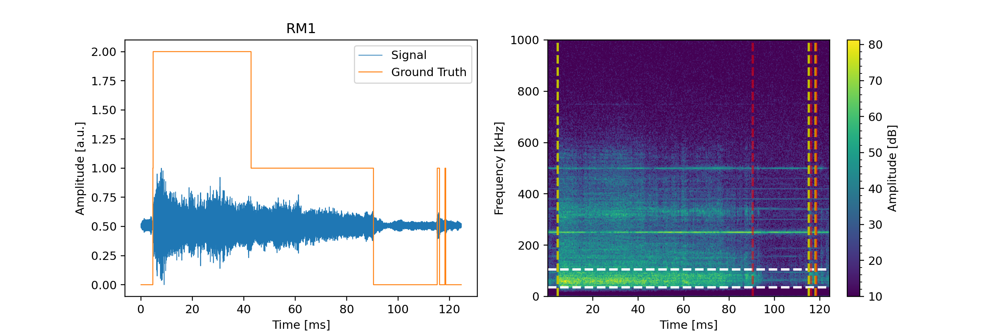

<IPython.core.display.Javascript object>


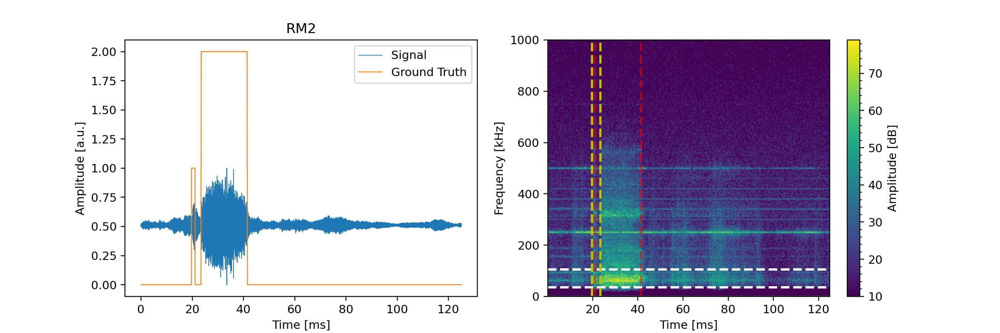

<IPython.core.display.Javascript object>


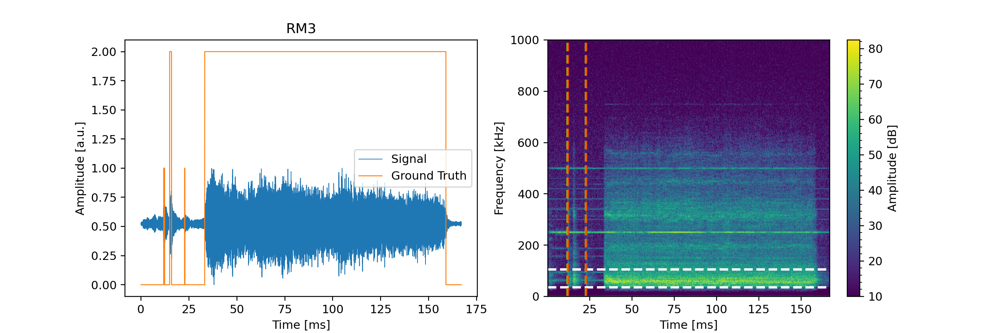

<IPython.core.display.Javascript object>


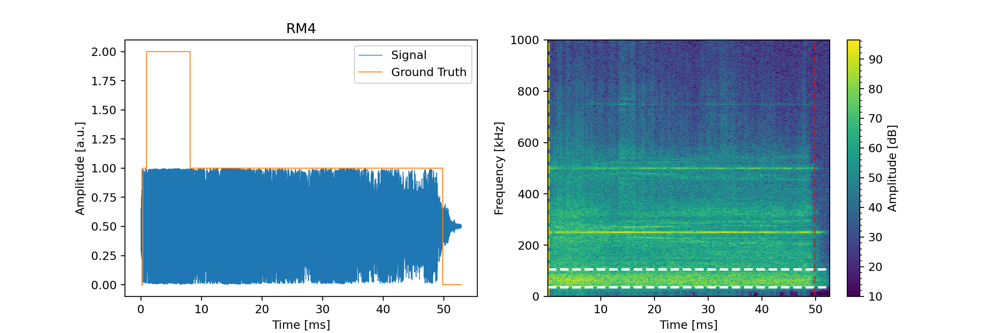

<IPython.core.display.Javascript object>


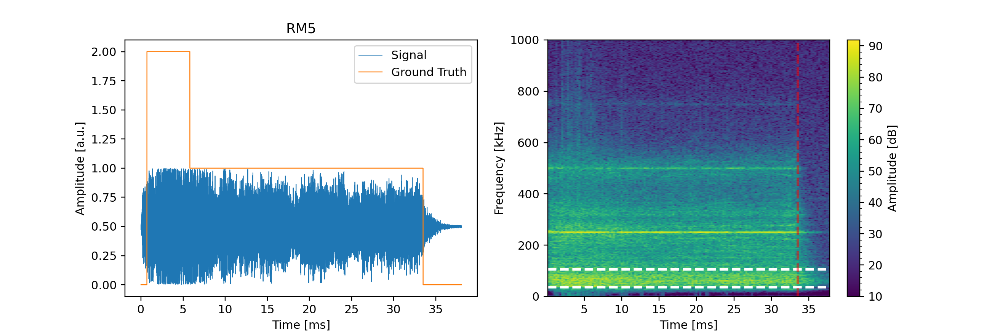

<IPython.core.display.Javascript object>


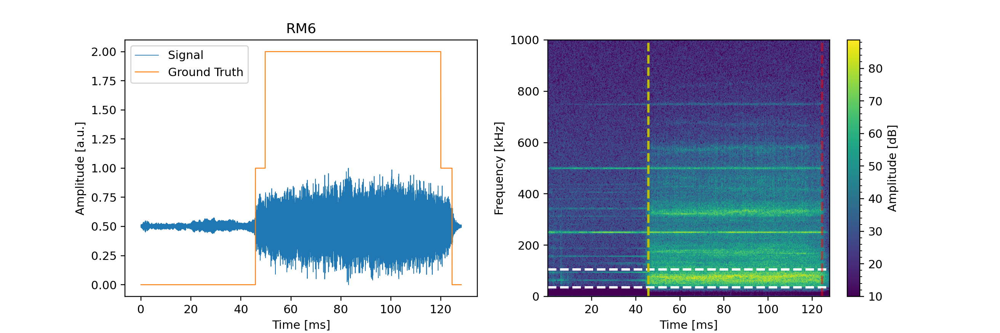

<IPython.core.display.Javascript object>


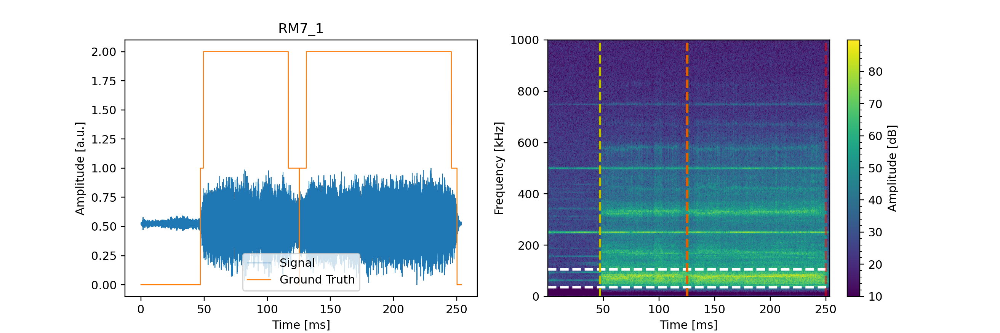

<IPython.core.display.Javascript object>


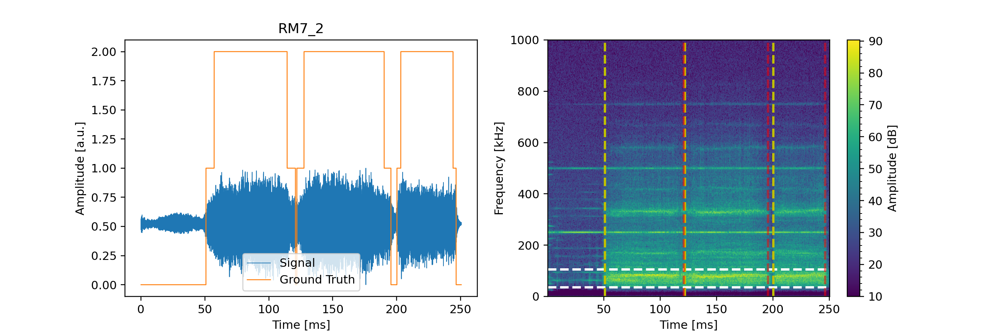

<IPython.core.display.Javascript object>


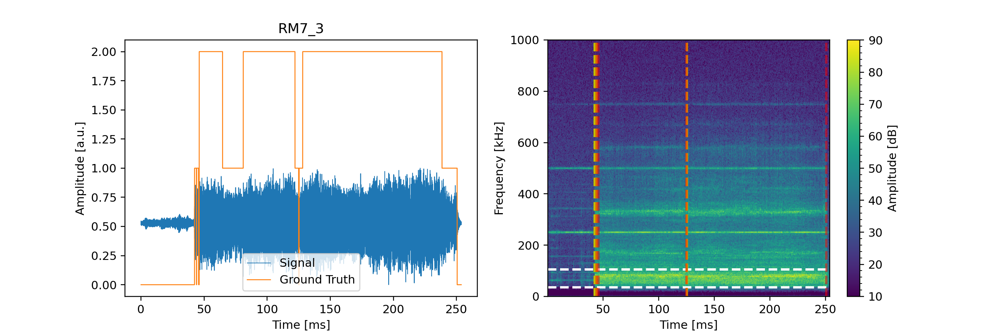

In [16]:
def plot_signal_vs_time(ax, time, x, GT, name):
    ax.plot(time, (x-min(x))/(max(x)-min(x)), label='Signal', linewidth=0.6)
    ax.plot(time, GT, label='Ground Truth', linewidth=0.8)
    ax.set_title(name)
    ax.set_xlabel('Time [ms]')
    ax.set_ylabel('Amplitude [a.u.]')
    ax.legend()

def plot_spectrogram(ax, x, Fs, starts, ends):
    scale = 1e3  # KHz conversion
    vmin = 10  # hide anything below this value
    spec, freqs, t, im = ax.specgram(x, Fs=Fs, scale='dB', NFFT=2**10, mode='psd', noverlap=512, vmin=vmin)
    ax.set_ylabel('Frequency [kHz]')
    ax.set_xlabel('Time [ms]')
    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label('Amplitude [dB]')
    cbar.minorticks_on()

    ax.axhline(35000, 0, 1, c='w', linestyle='--', linewidth=2)
    ax.axhline(105000, 0, 1, c='w', linestyle='--', linewidth=2)
    
    for start in starts:
        ax.axvline(time[start]/scale, 0, 1, c='y', linewidth=2, linestyle='--', alpha=1)
    for end in ends:
        ax.axvline(time[end]/scale, 0, 1, c='r', linewidth=2, linestyle='--', alpha=0.5)

    ticks = matplotlib.ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale))
    ax.yaxis.set_major_formatter(ticks)
    ticks = matplotlib.ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x*scale))
    ax.xaxis.set_major_formatter(ticks)

def get_ground_truth_intervals(GT):
    starts, ends = [], []
    for i in range(len(GT)-1):
        if GT[i] == 0 and GT[i+1] == 1:
            starts.append(i)
        if GT[i] == 1 and GT[i+1] == 0:
            ends.append(i)
    return starts, ends

# Main loop for plotting
for index in range(len(names)):
    fig, axs = plt.subplots(1, 2)
    x = xs[index].view(-1).numpy()
    time = np.linspace(start=0, stop=len(x)*1/Fs, num=len(x))*1000
    GT = GTs[index].numpy()
    
    plot_signal_vs_time(axs[0], time, x, GT, names[index])
    
    starts, ends = get_ground_truth_intervals(GT)
    plot_spectrogram(axs[1], x, Fs, starts, ends)
    
    fig.set_size_inches(12, 4)


---
**Disclaimer and Credits**

**Disclaimer**: This code is shared to promote transparency and further research. While every effort has been exerted to ensure its accuracy, we provide it "as-is" without warranties. Users are advised to utilize, adapt, and modify the code at their discretion and risk. The authors disclaim any liability arising from its use, including, but not limited to, errors or unintended outcomes.

**Credits**: The conceptualization and execution of this code are credited to Giulio Masinelli. Released under the CC0 license in accordance with Nature Communication's recommendations. Refer to the paper, "Harmonizing Sound and Light: X-Ray Imaging Unveils Acoustic Signatures of Stochastic Inter-Regime Instabilities during Laser Melting," for a comprehensive understanding.

**Contact**: For queries, further details, or opportunities related to this research segment, please connect with Giulio Masinelli at [giulio.masinelli@empa.ch](mailto:giulio.masinelli@empa.ch).

---